## ***Banglore Property Price Analysis--Statistical Masures***

In [140]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis
from sklearn.preprocessing import StandardScaler, RobustScaler
from scipy.stats import zscore

import warnings
warnings.filterwarnings("ignore")

***Load the dataset***

In [195]:
# Load the dataset
df = pd.read_csv('house_price.csv')


## ***Q1. Perform basic EDA***

***Display the first few rows of the dataframe to understand its structure***

In [163]:
df.head()

,location,size,total_sqft,bath,price,bhk,price_per_sqft
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2,3699
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4,4615
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3,4305
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3,6245
4,Kothanur,2 BHK,1200.0,2.0,51.00,2,4250


***Dimensions of the DataFrame, which consists of the number of rows and columns***

In [166]:
df.shape

(13200, 7)

***Check data types and non-null counts***

In [160]:
print("\nData Types and Non-Null Counts:\n")
print(df.info())



Data Types and Non-Null Counts:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13200 entries, 0 to 13199
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   location        13200 non-null  object 
 1   size            13200 non-null  object 
 2   total_sqft      13200 non-null  float64
 3   bath            13200 non-null  float64
 4   price           13200 non-null  float64
 5   bhk             13200 non-null  int64  
 6   price_per_sqft  13200 non-null  int64  
dtypes: float64(3), int64(2), object(2)
memory usage: 722.0+ KB
None


***Check the Missing Values in the dataset***

In [16]:
print(df.isnull().sum())

location          0
size              0
total_sqft        0
bath              0
price             0
bhk               0
price_per_sqft    0
dtype: int64


***Display summary statistics***

In [18]:
print(df.describe())

         total_sqft          bath         price           bhk  price_per_sqft
count  13200.000000  13200.000000  13200.000000  13200.000000    1.320000e+04
mean    1555.302783      2.691136    112.276178      2.800833    7.920337e+03
std     1237.323445      1.338915    149.175995      1.292843    1.067272e+05
min        1.000000      1.000000      8.000000      1.000000    2.670000e+02
25%     1100.000000      2.000000     50.000000      2.000000    4.267000e+03
50%     1275.000000      2.000000     71.850000      3.000000    5.438000e+03
75%     1672.000000      3.000000    120.000000      3.000000    7.317000e+03
max    52272.000000     40.000000   3600.000000     43.000000    1.200000e+07


***Check duplicate records in the dataset***

In [197]:
# Check for duplicates
duplicates_count = df.duplicated().sum()

# Print the count of duplicate records
if duplicates_count > 0:
    print(f"\nNumber of duplicate records: {duplicates_count}\n")
else:
    print("Number of  duplicate records found.")
    

# Check for duplicates
duplicates = df[df.duplicated()]
# Print duplicates with header and all data
if not duplicates.empty:
    print(duplicates.to_string(index=False))
else:
    print("No duplicate records found.")



Number of duplicate records: 1049

                   location      size  total_sqft  bath  price  bhk  price_per_sqft
                 Chandapura     1 BHK      645.00   1.0  16.45    1            2550
                      other     2 BHK     1100.00   2.0  48.00    2            4363
                 Chandapura     2 BHK     1015.00   2.0  25.88    2            2549
                 Whitefield     2 BHK     1116.00   2.0  51.91    2            4651
             Kanakpura Road     1 BHK      525.00   1.0  26.00    1            4952
               Haralur Road     3 BHK     1464.00   3.0  56.00    3            3825
                Mysore Road     2 BHK     1175.00   2.0  73.50    2            6255
               Haralur Road     2 BHK     1027.00   2.0  44.00    2            4284
                Vittasandra     2 BHK     1246.00   2.0  64.50    2            5176
                  Kambipura     2 BHK      883.00   2.0  45.00    2            5096
                      other 3 Bedroom   

***Check the unique records in the dataset*** & ***Remove duplicates***

In [201]:

# Count the number of unique records in the DataFrame based on the specified columns
unique_records_count = df.drop_duplicates(subset=['location', 'size', 'price', 'total_sqft', 'bath', 'price_per_sqft']).shape[0]

print(f"Number of unique records: {unique_records_count}")
# Print the count of duplicate records
if duplicates_count > 0:
    print(f"Number of deleted duplicate records: {duplicates_count}")
else:
    print("No duplicate records found.")

# Remove duplicates based on location, total_sqft, price, and price_per_sqft
df_unique = df.drop_duplicates(subset=["location","size", "total_sqft", "bath","price","bhk", "price_per_sqft",])

# Count the number of duplicate records (deleted records)
duplicates_count = len(df) - len(df_unique)

df=df_unique

Number of unique records: 12151
Number of deleted duplicate records: 1049


***Number of records after deleting the duplicate***

In [233]:
# display the column names of a DataFrames
df=df_unique
print(df.columns)

df=df_unique
(df_unique.shape)

Index(['location', 'size', 'total_sqft', 'bath', 'price', 'bhk',
       'price_per_sqft', 'z_score'],
      dtype='object')


(12151, 8)

***Check dataset is symmetric or assymetric***

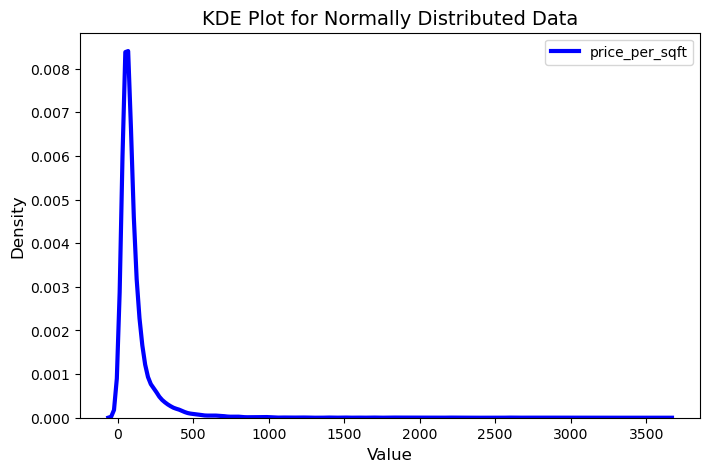

In [184]:
# To understand the dataset is symmetric or assymeric 
# Symmetric Dataset: If the dataset is symmetric, the KDE plot will show a smooth, bell-shaped curve centered around the mean.
# The curve should be relatively even on both sides, indicating that the data is evenly distributed.
# If the dataset is asymmetric, the KDE plot will reflect that with an uneven curve.
# Read dataset
df = df_unique

#Plot KDE for both columns
plt.figure(figsize=(8, 5))
sns.kdeplot(df["price"], color='blue',  label="price_per_sqft",linewidth=3)

# Labels and Title
plt.xlabel("Value", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.title("KDE Plot for Normally Distributed Data", fontsize=14)
plt.legend()

# Show Plot
# plt.show()

***box plot, before the removal of outlier data***


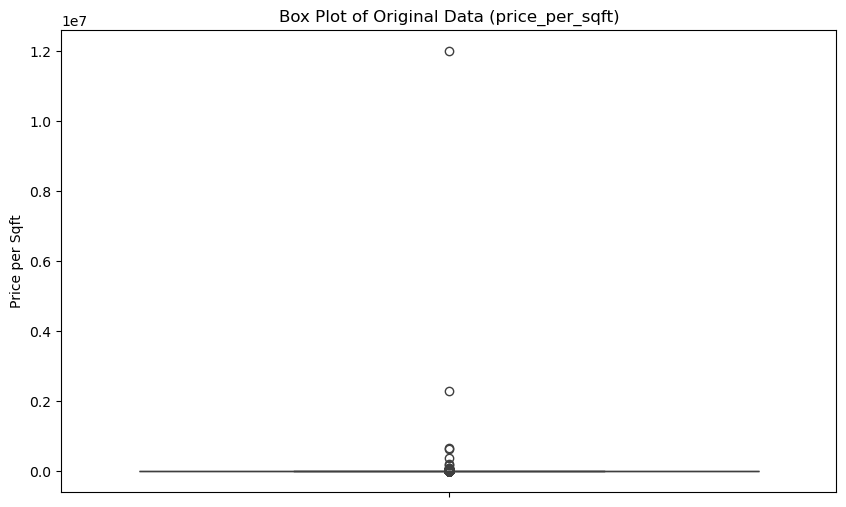

In [30]:

# a box plot for before remove the outliers of data
plt.figure(figsize=(10,6))
sns.boxplot(y=df['price_per_sqft'])
plt.title('Box Plot of Original Data (price_per_sqft)')
plt.ylabel('Price per Sqft')
plt.show()

## ***Q2. Detect and Remove Outliers***

***Outliers can affect the analysis significantly .Hence we will used different methods to detect the outliers and opt the best option available***

### ***A).   Mean and Standard Deviation***

In [212]:
mean = df['price_per_sqft'].mean()
print(mean)

8132.641840177763


In [34]:
std_dev = df['price_per_sqft'].std()
print(std_dev)

111232.9008957087


***Removing Outliers using Standard Deviation Method***

In [36]:
# data without outliers. 
df_mean_std = df[(df['price_per_sqft'] > (mean - 3 * std_dev)) & (df['price_per_sqft'] < (mean + 3 * std_dev))]
display(df_mean_std)

,location,size,total_sqft,bath,price,bhk,price_per_sqft
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2,3699
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4,4615
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3,4305
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3,6245
4,Kothanur,2 BHK,1200.0,2.0,51.00,2,4250
...,...,...,...,...,...,...,...
13194,Green Glen Layout,3 BHK,1715.0,3.0,112.00,3,6530
13195,Whitefield,5 Bedroom,3453.0,4.0,231.00,5,6689
13196,other,4 BHK,3600.0,5.0,400.00,4,11111
13197,Raja Rajeshwari Nagar,2 BHK,1141.0,2.0,60.00,2,5258


***Outliers Detected and Removed Using Mean and Standard Deviation Method Outliers are detected if they fall outside 
the range of (mean ± 3 * std_dev)***

***Number of outliers detected: 5 Shape of dataset after removing outliers: 12,146 rows and 7 columns***

### ***B). Percentile Method***

***Calculate the lower bound using the 5th percentile***

In [42]:
lower_bound = df['price_per_sqft'].quantile(0.05)
print(lower_bound)

3150.0


***Calculate the upper bound using the 95th percentile***

In [43]:
upper_bound = df['price_per_sqft'].quantile(0.95)
print(upper_bound)

15600.0


***Filter the DataFrame to remove outliers based on the calculated bounds***

In [44]:
df_percentile = df[(df['price_per_sqft'] > lower_bound) & (df['price_per_sqft'] < upper_bound)]
# print(df_percentile)
display(df_percentile)


,location,size,total_sqft,bath,price,bhk,price_per_sqft
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2,3699
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4,4615
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3,4305
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3,6245
4,Kothanur,2 BHK,1200.0,2.0,51.00,2,4250
...,...,...,...,...,...,...,...
13194,Green Glen Layout,3 BHK,1715.0,3.0,112.00,3,6530
13195,Whitefield,5 Bedroom,3453.0,4.0,231.00,5,6689
13196,other,4 BHK,3600.0,5.0,400.00,4,11111
13197,Raja Rajeshwari Nagar,2 BHK,1141.0,2.0,60.00,2,5258


***5th Percentile (lower_bound)Values below this threshold are considered as lower outliers. 95th Percentile (upper_bound)Values above this threshold are considered as upper outliers*** 

***The filtered dataset percentile_newdata retains only the values within this range, effectively removing outliers. 10928 rows x 7 columns***

### ***C). IQR -Interquartile Range Method***

In [47]:
# Calculate Q1 (25th percentile)
Q1 = df['price_per_sqft'].quantile(0.25)
print("Q1",Q1)
# Calculate Q3 (75th percentile)
Q3 = df['price_per_sqft'].quantile(0.75)
print("Q3",Q3)
# Calculate IQR
IQR = Q3 - Q1
print("IQR=",IQR)

Q1 4312.0
Q3 7461.0
IQR= 3149.0


In [220]:
# Define outlier boundaries using the IQR method
lower_bound = Q1 - (1.5 * IQR)
upper_bound = Q3 + (1.5 * IQR)
# Print the lower and upper bounds
print("lower bound",lower_bound)
print("upper bound",upper_bound)

lower bound -411.5
upper bound 12184.5


In [ ]:
***Filter the DataFrame to remove outliers based on the calculated bounds***

In [49]:
df_iqr = df[(df['price_per_sqft'] > lower_bound) & (df['price_per_sqft'] < upper_bound)]
display(df_iqr)

,location,size,total_sqft,bath,price,bhk,price_per_sqft
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2,3699
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4,4615
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3,4305
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3,6245
4,Kothanur,2 BHK,1200.0,2.0,51.00,2,4250
...,...,...,...,...,...,...,...
13194,Green Glen Layout,3 BHK,1715.0,3.0,112.00,3,6530
13195,Whitefield,5 Bedroom,3453.0,4.0,231.00,5,6689
13196,other,4 BHK,3600.0,5.0,400.00,4,11111
13197,Raja Rajeshwari Nagar,2 BHK,1141.0,2.0,60.00,2,5258


***Outliers are detected if they fall above Q1 - 1.5 * IQR or above Q3 + 1.5 * IQR.***

***Q1 = data['price_per_sqft'].quantile(0.25):*** 

***This calculates the first quartile (25th percentile) of the price_per_sqft column***

***Q3 = data['price_per_sqft'].quantile(0.75):***

***This calculates the third quartile (75th percentile) of the price_per_sqft column*** 

***IQR = Q3 - Q1:***

***The IQR is the range between the 25th and 75th percentiles. It measures the spread of the middle 50% of the data***

***Filter the Data to Remove Outliers after 11009 rows x 7 columns***

### ***D). Z-Score Method***

In [222]:
# Calculate the mean and standard deviation of price_per_sqft
mean_price = df['price_per_sqft'].mean()
std_dev_price = df['price_per_sqft'].std()
df['z_score'] = (df['price_per_sqft'] - mean_price) / std_dev_price

In [53]:
# Filter data to remove outliers based on Z-score method
df_zscore = df[(df['z_score'] > -3) & (df['z_score'] < 3)]
display(df_zscore)

,location,size,total_sqft,bath,price,bhk,price_per_sqft,z_score
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2,3699,-0.039859
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4,4615,-0.031624
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3,4305,-0.034411
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3,6245,-0.016970
4,Kothanur,2 BHK,1200.0,2.0,51.00,2,4250,-0.034906
...,...,...,...,...,...,...,...,...
13194,Green Glen Layout,3 BHK,1715.0,3.0,112.00,3,6530,-0.014408
13195,Whitefield,5 Bedroom,3453.0,4.0,231.00,5,6689,-0.012979
13196,other,4 BHK,3600.0,5.0,400.00,4,11111,0.026776
13197,Raja Rajeshwari Nagar,2 BHK,1141.0,2.0,60.00,2,5258,-0.025843


## ***Q3. Box Plot Analysis to determine the best outlier removal method***

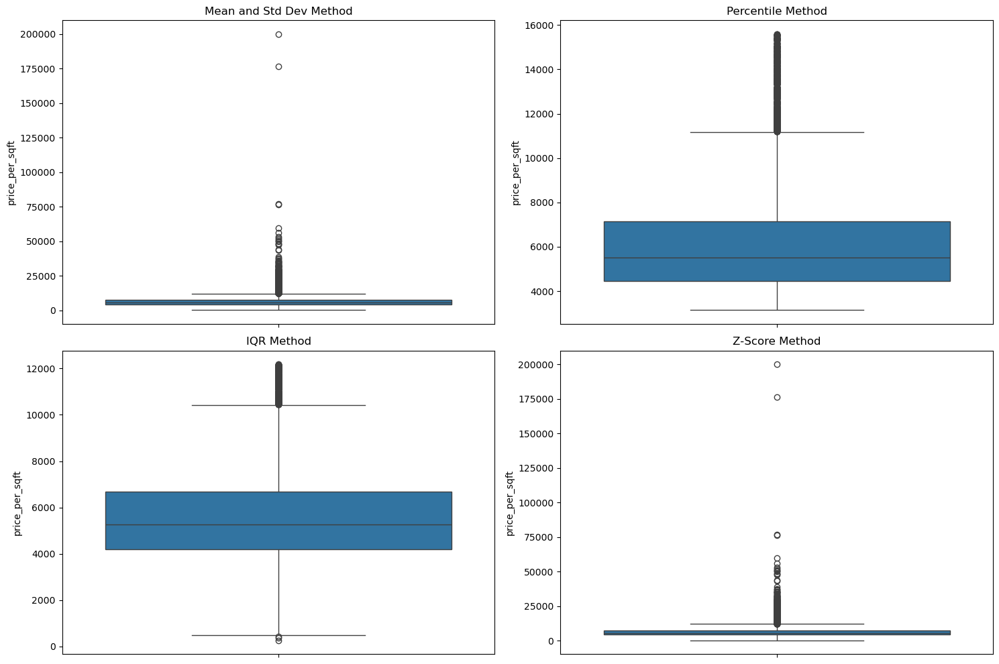

In [55]:
# Plotting
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Mean and Standard Deviation Method
sns.boxplot(y=df_mean_std['price_per_sqft'], ax=axes[0, 0])
axes[0, 0].set_title('Mean and Std Dev Method')

# Percentile Method
sns.boxplot(y=df_percentile['price_per_sqft'], ax=axes[0, 1])
axes[0, 1].set_title('Percentile Method')

# IQR Method
sns.boxplot(y=df_iqr['price_per_sqft'], ax=axes[1, 0])
axes[1, 0].set_title('IQR Method')

# Z-Score Method
sns.boxplot(y=df_zscore['price_per_sqft'], ax=axes[1, 1])
axes[1, 1].set_title('Z-Score Method')

plt.tight_layout()
plt.show()

***A. Mean and Standard Deviation Method:***  
***Effective For: Normally distributed data. Sensitive To: Extreme outliers.***
***Approach: This method identifies outliers based on how many standard deviations a value is from the mean.***

***B. Percentile Method:***  
***Effective For: Data with extreme outliers.
Approach: This method trims a certain percentage (e.g., the extreme 5%) from both ends of the dataset.***

***C. IQR Method:***     
***Effective For: Skewed data and data with extreme outliers.
Approach: This method removes values that lie beyond 1.5 times the Interquartile Range (IQR) from the first and third quartiles. Suitable for skewed distributions. May not be as effective if the data is normally distributed***

***D. Z-Score Method:***  
***Effective For: Normally distributed data. Approach: This method keeps data points with z-scores between -3 and 3, effectively removing those with extreme z-scores.***

***The IQR Method and Percentile Method are more robust and effective for skewed distributions or data with extreme outliers. The IQR Method is particularly beneficial for datasets where the distribution is skewed, as it focuses on the middle 50% of data and removes outliers based on the spread of the middle range. The Percentile Method is highly effective in removing extreme outliers by trimming a specified percentage from both ends, making it useful for datasets with extreme values.***

## ***Q 4.Draw histplot to check the normality of the column(price per sqft column) and perform transformations if needed. Check the skewness and kurtosis before and after the transformation.***

In [58]:
# Calculate skewness before the log transformation
skewness = skew(df['price_per_sqft'])
kurtosis = kurtosis(df['price_per_sqft'])
print("Original Skewness",skewness)
print("Original Kurtosis",kurtosis)

Original Skewness 103.88920549434178
Original Kurtosis 11131.230839805388


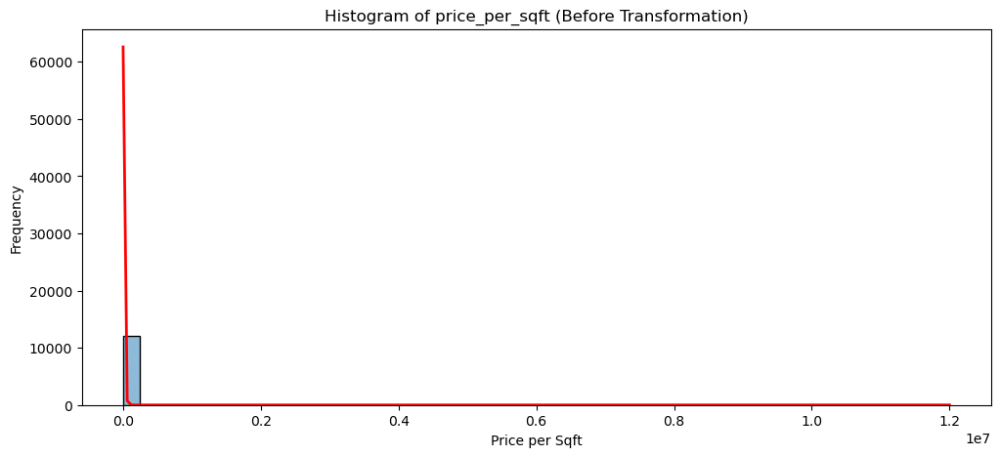

In [59]:
# plot the KDE before Transformation

plt.figure(figsize=(12, 5))
ax = sns.histplot(df["price_per_sqft"], bins=50, kde=True)
ax.lines[0].set_color('red')  # Set the color of the KDE line
ax.lines[0].set_linewidth(2)  # Increase the linewidth of the KDE line
plt.title("Histogram of price_per_sqft (Before Transformation)")
plt.xlabel("Price per Sqft")
plt.ylabel("Frequency")
plt.show()


***Applying log transformation method to 'price_per_sqrft'***

In [61]:
# log transformation
df['price_per_sqft_log'] = np.log(df['price_per_sqft']) 
df['price_per_sqft_log']
print(df['price_per_sqft_log'])

0        8.215818
1        8.437067
2        8.367532
3        8.739536
4        8.354674
           ...   
13194    8.784162
13195    8.808220
13196    9.315691
13197    8.567506
13198    9.250234
Name: price_per_sqft_log, Length: 12151, dtype: float64


***Applying log transformation method***

In [97]:

df = pd.DataFrame(df_unique)

# Apply log transformation
df = df_unique.copy()  # Use df_unique as your DataFrame

df['price_per_sqft_log'] = np.log(df['price_per_sqft'])

# Calculate skewness and kurtosis for log-transformed data
transformed_skew = skew(df['price_per_sqft_log'])
transformed_kurtosis = kurtosis(df['price_per_sqft_log'])

# Display the results
print("Transformed Skewness:", transformed_skew)
print("Transformed Kurtosis:", transformed_kurtosis)

Transformed Skewness: 1.400238670119574
Transformed Kurtosis: 9.40102516314437


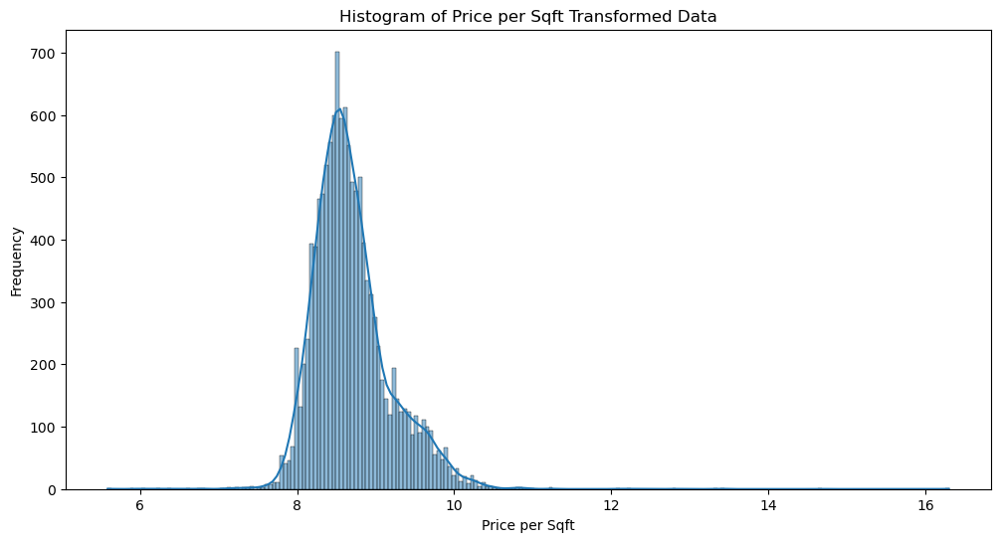

In [68]:
# Plot histogram after transformation
plt.figure(figsize=(12, 6))
sns.histplot(df['price_per_sqft_log'], kde=True)
plt.title('Histogram of Price per Sqft Transformed Data')
plt.xlabel('Price per Sqft') 
plt.ylabel('Frequency')
plt.show()

***The original price_per_sqft data had a highly right-skewed distribution with a skewness of approximately 103.889 and a very high kurtosis value of around 11131.23, indicating extremely heavy tails.The histogram shows that the data is extremely right-skewed, with a long tail on the right side, which aligns with our skewness and kurtosis values. Through this analysis, we observed that the original price_per_sqft data was highly skewed with extremely heavy tails, as indicated by the very high skewness and kurtosis values*** 

***There are several transformations we can apply to reduce skewness and kurtosis in our data***

***a).   Log Transformation:***  

***Apply the natural logarithm to our data. This works well for data that is strictly positive***  

***Applying a log transformation significantly improved the distribution, resulting in skewness and kurtosis values closer to those of a normal distribution. Transformed Skewness: 1.400238670119574 Transformed Kurtosis: 9.40102516314437 With a transformed skewness of approximately 1.4002 and a transformed kurtosis of around 9.4010, you likely have a distribution that is positively skewed (since the skewness is positive) and leptokurtic (since the kurtosis is greater than 3, indicating heavier tails than a normal distribution)***



***squre root method***

In [70]:
# Check original skewness
print("Original Skewness:\n", df[["price_per_sqft", "total_sqft", "bath", "price", "bhk"]].skew())


Original Skewness:
 price_per_sqft    103.902032
total_sqft         15.112123
bath                4.214944
price               7.915103
bhk                 4.838129
dtype: float64


In [72]:
# Apply square root transformation to selected columns
df[['price_per_sqft_sqrt', 'total_sqft_sqrt', 'bath_sqrt', 'price_sqrt', 'bhk_sqrt']] = np.sqrt(df[["price_per_sqft", "total_sqft", "bath", "price", "bhk"]])
# Check skewness after transformation
print("Square Root Skewness:\n", df[['price_per_sqft_sqrt', 'total_sqft_sqrt', 'bath_sqrt', 'price_sqrt', 'bhk_sqrt']].skew())


Square Root Skewness:
 price_per_sqft_sqrt    50.039544
total_sqft_sqrt         3.524760
bath_sqrt               1.510666
price_sqrt              2.865639
bhk_sqrt                1.453282
dtype: float64


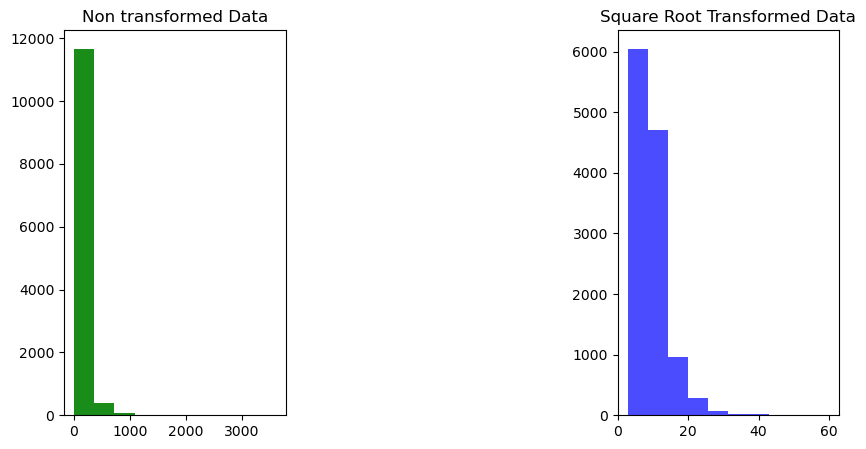

In [74]:
# Plot the distributions
plt.figure(figsize=(10, 5))

# Original data distribution (Example: price column)
plt.subplot(1, 2, 1)
plt.hist(df['price'], bins=10, color='green', alpha=0.9)
plt.title("Non transformed Data")


# Transformed data distribution (Example: price_sqrt column)
plt.subplot(1, 2, 2)
plt.hist(df['price_sqrt'], bins=10, color='blue', alpha=0.7)
plt.title("Square Root Transformed Data")

# Adjust the space between the plots
plt.subplots_adjust(wspace=1.5)

# plt.tight_layout()
plt.show()


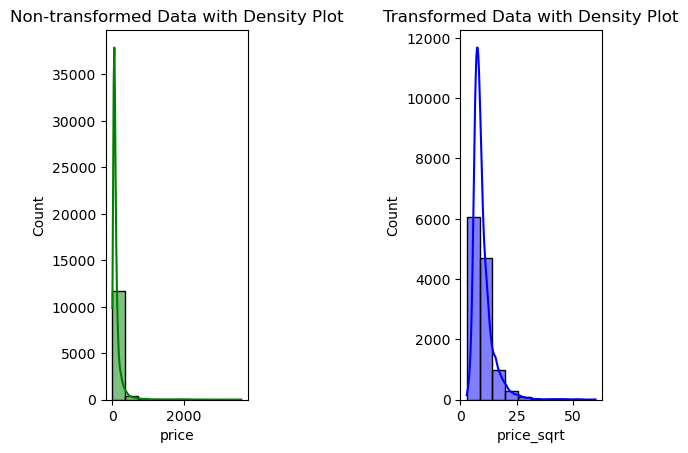

In [76]:

# Original data distribution with density plot (Example: price column)
plt.subplot(1, 2, 1)
sns.histplot(df['price'], bins=10, kde=True, color='green')
plt.title("Non-transformed Data with Density Plot")



# Transformed data distribution with density plot (Example: price column)
plt.subplot(1, 2, 2)
sns.histplot(df['price_sqrt'], bins=10, kde=True, color='Blue')
plt.title("Transformed Data with Density Plot")

# Adjust the space between the plots
plt.subplots_adjust(wspace=1.5)

# plt.tight_layout()
plt.show()



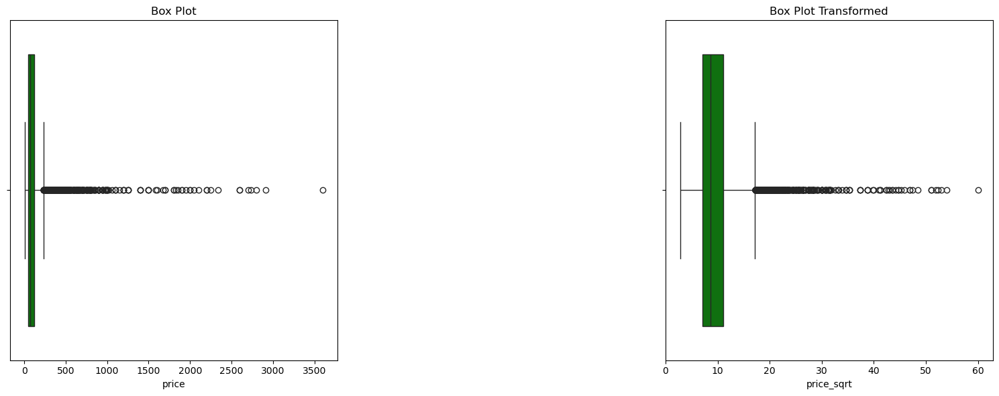

In [78]:
# Set the figure size to be larger
plt.figure(figsize=(15, 6))


# Box plot
plt.subplot(1, 2, 1)
sns.boxplot(x=df['price'], color='green')
plt.title("Box Plot")

# plt.tight_layout()
# plt.show()

# Box plot
plt.subplot(1, 2, 2)
sns.boxplot(x=df['price_sqrt'], color='green')
plt.title("Box Plot Transformed")

plt.tight_layout()

# Adjust the space between the plots
plt.subplots_adjust(wspace=1)

plt.show()


### ***Q5. Check the correlation between all the numerical columns and plot heatmap***

In [247]:

# # Compute correlation matrix for numerical columns
#  # Ensure only numerical columns are considered
# correlation_matrix = df.corr(numeric_only=True) 

# Compute correlation matrix for numerical columns
# Drop specified columns non numberic
df1 = df.drop(["location", "size", ], axis=1)
display(df1)

,total_sqft,bath,price,bhk,price_per_sqft,z_score
0,1056.0,2.0,39.07,2,3699,-0.039859
1,2600.0,5.0,120.00,4,4615,-0.031624
2,1440.0,2.0,62.00,3,4305,-0.034411
3,1521.0,3.0,95.00,3,6245,-0.016970
4,1200.0,2.0,51.00,2,4250,-0.034906
...,...,...,...,...,...,...
13194,1715.0,3.0,112.00,3,6530,-0.014408
13195,3453.0,4.0,231.00,5,6689,-0.012979
13196,3600.0,5.0,400.00,4,11111,0.026776
13197,1141.0,2.0,60.00,2,5258,-0.025843


In [241]:
# Print correlation matrix
display(corr_matrix)


,total_sqft,bath,price,bhk,price_per_sqft,z_score
total_sqft,1.000000,0.386694,0.572516,0.339936,-0.008877,-0.008877
bath,0.386694,1.000000,0.448802,0.898875,0.030133,0.030133
price,0.572516,0.448802,1.000000,0.390008,0.027415,0.027415
bhk,0.339936,0.898875,0.390008,1.000000,0.030294,0.030294
price_per_sqft,-0.008877,0.030133,0.027415,0.030294,1.000000,1.000000
z_score,-0.008877,0.030133,0.027415,0.030294,1.000000,1.000000


***Correlation Heat Map for all the  columns***

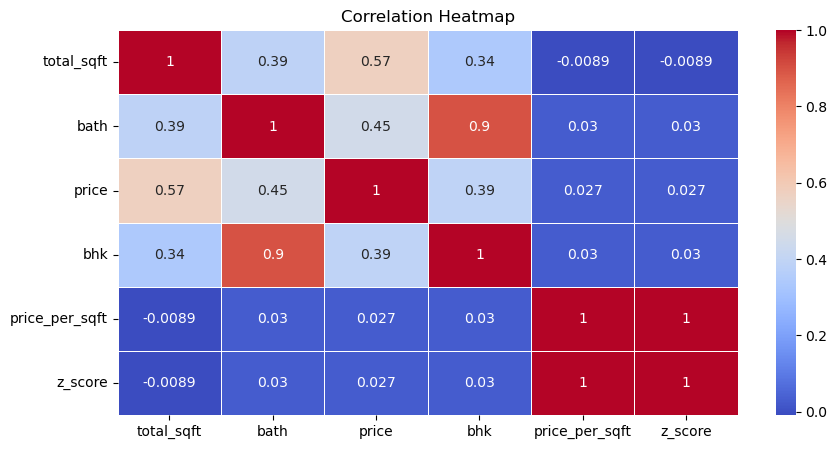

In [243]:


plt.figure(figsize=(10, 5))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()

***Correlation Heat Map without z-score & srqure root  columns***

,total_sqft,bath,price,bhk,price_per_sqft
total_sqft,1.000000,0.386694,0.572516,0.339936,-0.008877
bath,0.386694,1.000000,0.448802,0.898875,0.030133
price,0.572516,0.448802,1.000000,0.390008,0.027415
bhk,0.339936,0.898875,0.390008,1.000000,0.030294
price_per_sqft,-0.008877,0.030133,0.027415,0.030294,1.000000


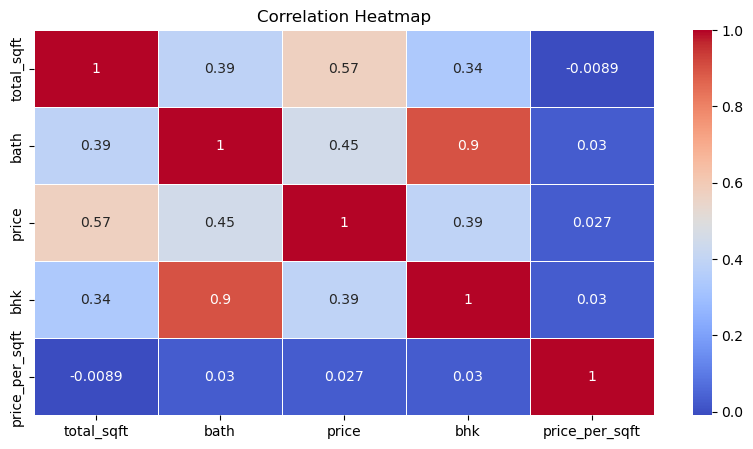

In [245]:
df1 = df.drop(["location", "size", "z_score",],axis=1)

# Compute correlation matrix
corr_matrix = df1.corr()

# Print correlation matrix
display(corr_matrix)
plt.figure(figsize=(10, 5))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()

***The correlation coefficient ranges from -1 to 1. 1 indicates a perfect positive linear relationship. -1 indicates a perfect negative linear relationship. 0 indicates no linear relationship.***  

#### ***Key Observations from the Heatmap:***

***Strong Positive Correlation:***

***Bath and BHK (0.9): A high correlation between the number of bathrooms and bedrooms implies that properties with more bedrooms tend to have more bathrooms.***

***Moderate Positive Correlation:***

***Total Square Feet and Price (0.57): This shows that larger properties generally have higher prices.***

***Weak Correlation:***

***Price per Square Foot: This variable has very weak correlations with other variables, suggesting that the price per square foot is relatively independent of other factors in the dataset, such as location-specific amenities or market conditions.***

### ***Insights and Potential Predictors:***


***Total Square Feet, Number of Bathrooms, and Number of Bedrooms are strong predictors of property price.***

***Price per Square Foot is relatively independent, indicating other factors might play a significant role in determining it.***

## ***Q6: Draw Scatter Plot Between Variables to Check Correlation***

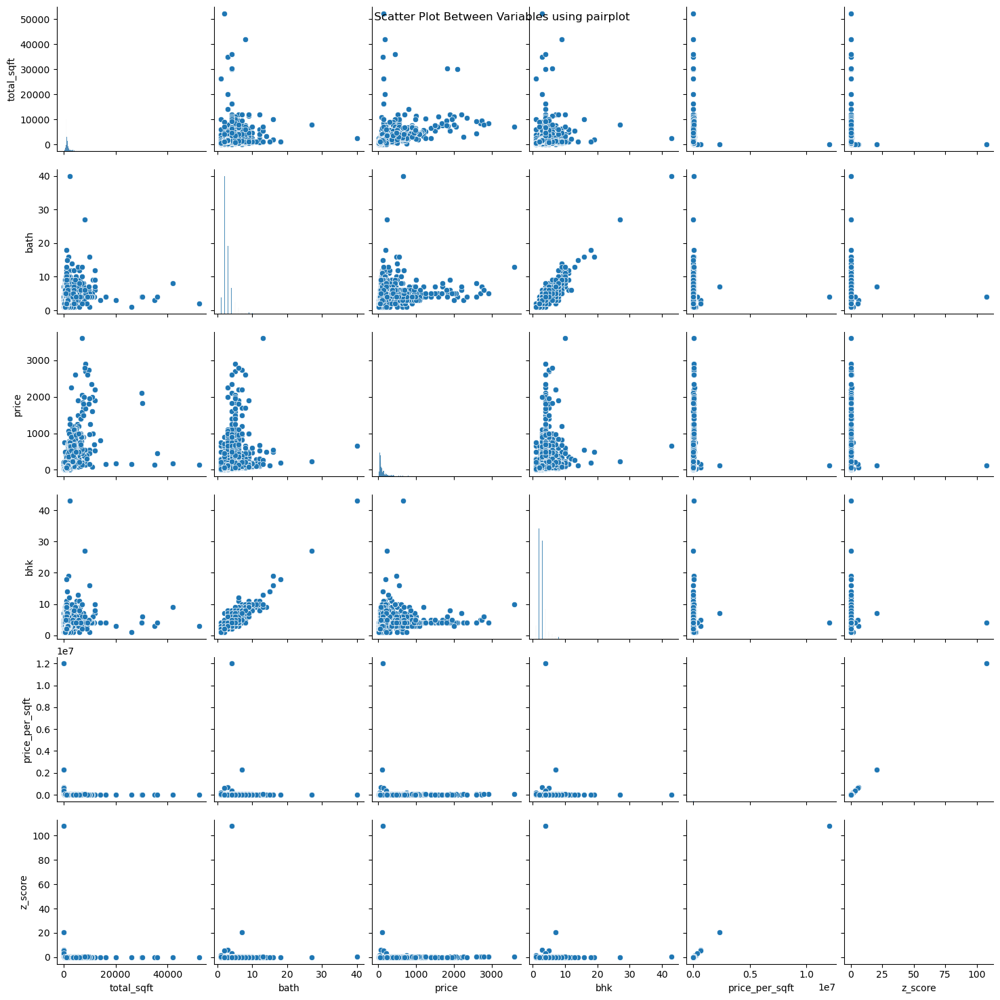

In [249]:
df1 = df.drop(["location", "size", ], axis=1)
sns.pairplot(df1)
plt.suptitle(' Scatter Plot Between Variables using pairplot') 
plt.show()

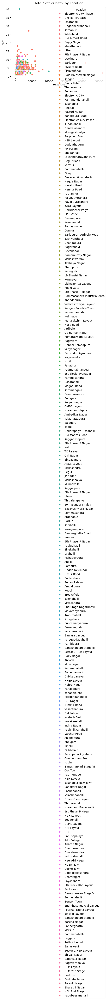

In [318]:
# Create a scatter plot with total_sqft vs bath, colored by location
sns.scatterplot(data=df, x="total_sqft", y="bath", hue="location")

# Set the title of the plot
plt.title('Total Sqft vs bath  by Location')

# Show the plot
plt.show()

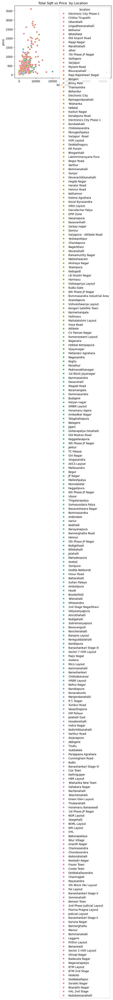

In [320]:
# Create a scatter plot with Total Sqft vs Price , colored by location
sns.scatterplot(data=df, x="total_sqft", y="price", hue="location")

# Set the title of the plot
plt.title('Total Sqft vs Price  by Location')

# Show the plot
plt.show()

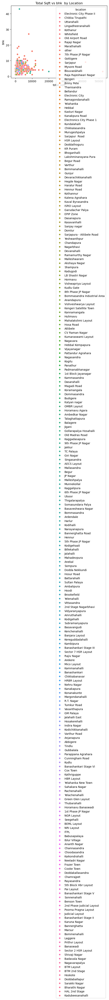

In [322]:
# Create a scatter plot with Total Sqft vs bhk , colored by location
sns.scatterplot(data=df, x="total_sqft", y="bhk", hue="location")

# Set the title of the plot
plt.title('Total Sqft vs bhk  by Location')

# Show the plot
plt.show()

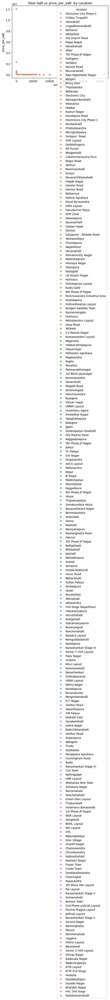

In [324]:
# Create a scatter plot with Total Sqft vs price_per_sqft , colored by location
sns.scatterplot(data=df, x="total_sqft", y="price_per_sqft", hue="location")

# Set the title of the plot
plt.title('Total Sqft vs price_per_sqft  by Location')

# Show the plot
plt.show()

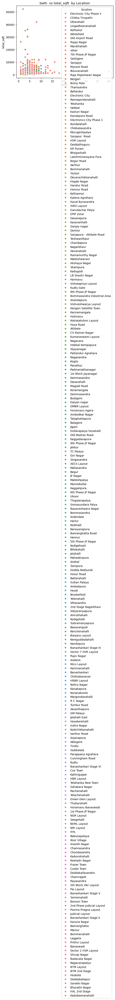

In [326]:
# Create a scatter plot with bath vs total_sqft , colored by location
sns.scatterplot(data=df, x="bath", y="total_sqft", hue="location")

# Set the title of the plot
plt.title('bath  vs total_sqft  by Location')

# Show the plot
plt.show()

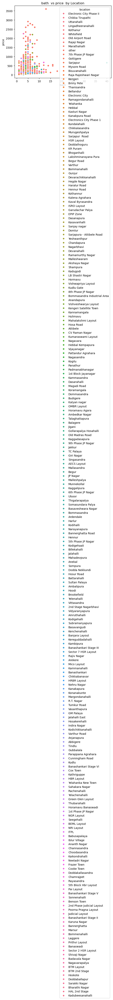

In [327]:
# Create a scatter plot with bath vs price , colored by location
sns.scatterplot(data=df, x="bath", y="price", hue="location")

# Set the title of the plot
plt.title('bath  vs price  by Location')

# Show the plot
plt.show()

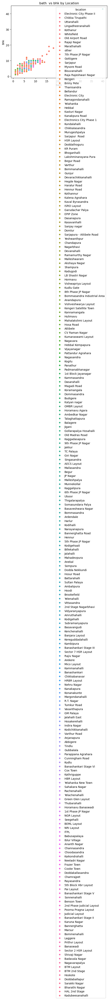

In [330]:
# Create a scatter plot with bath vs bhk , colored by location
sns.scatterplot(data=df, x="bath", y="bhk", hue="location")

# Set the title of the plot
plt.title('bath  vs bhk by Location')

# Show the plot
plt.show()

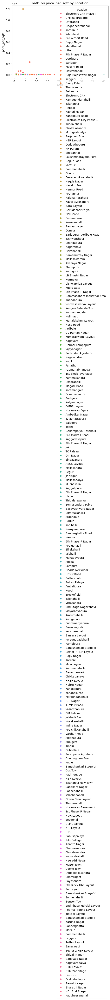

In [332]:
# Create a scatter plot with bath vs price_per_sqft , colored by location
sns.scatterplot(data=df, x="bath", y="price_per_sqft", hue="location")

# Set the title of the plot
plt.title('bath  vs price_per_sqft by Location')

# Show the plot
plt.show()

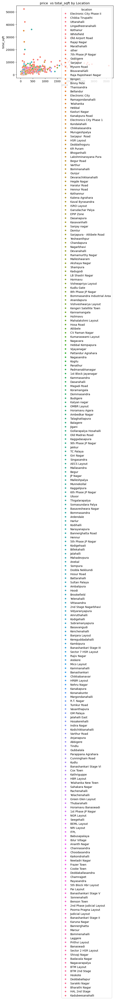

In [334]:
# Create a scatter plot with price vs total_sqft , colored by location
sns.scatterplot(data=df, x="price", y="total_sqft", hue="location")

# Set the title of the plot
plt.title('price  vs total_sqft by Location')

# Show the plot
plt.show()

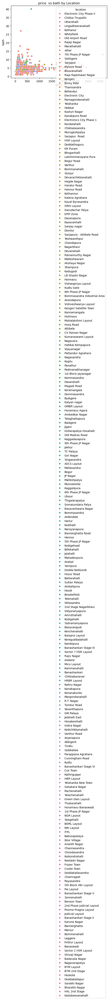

In [336]:
# Create a scatter plot with price vs bath , colored by location
sns.scatterplot(data=df, x="price", y="bath", hue="location")

# Set the title of the plot
plt.title('price  vs bath by Location')

# Show the plot
plt.show()

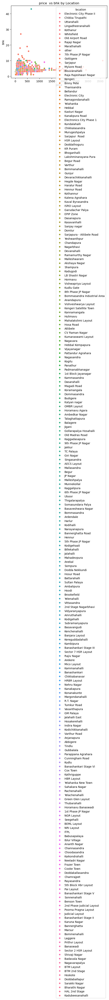

In [338]:
# Create a scatter plot with price vs bhk , colored by location
sns.scatterplot(data=df, x="price", y="bhk", hue="location")

# Set the title of the plot
plt.title('price  vs bhk by Location')

# Show the plot
plt.show()

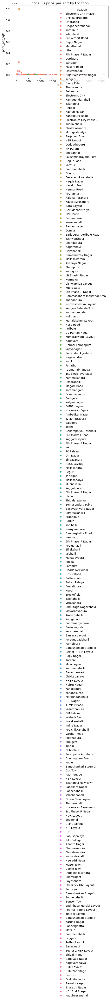

In [340]:
# Create a scatter plot with price vs price_per_sqft , colored by location
sns.scatterplot(data=df, x="price", y="price_per_sqft", hue="location")

# Set the title of the plot
plt.title('price  vs price_per_sqft by Location')

# Show the plot
plt.show()

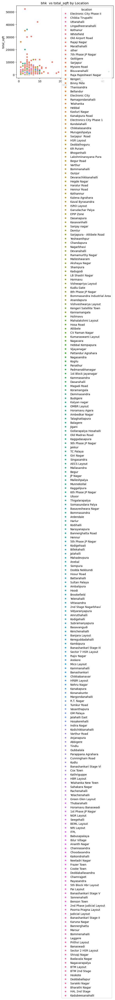

In [344]:
# Create a scatter plot with bhk vs total_sqft , colored by location
sns.scatterplot(data=df, x="bhk", y="total_sqft", hue="location")

# Set the title of the plot
plt.title('bhk  vs total_sqft by Location')

# Show the plot
plt.show()

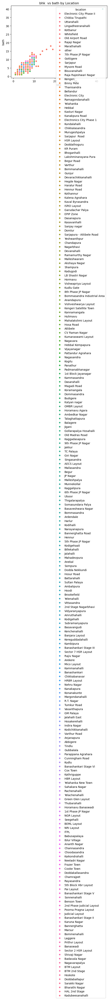

In [342]:
# Create a scatter plot with bhk vs bath , colored by location
sns.scatterplot(data=df, x="bhk", y="bath", hue="location")

# Set the title of the plot
plt.title('bhk  vs bath by Location')

# Show the plot
plt.show()

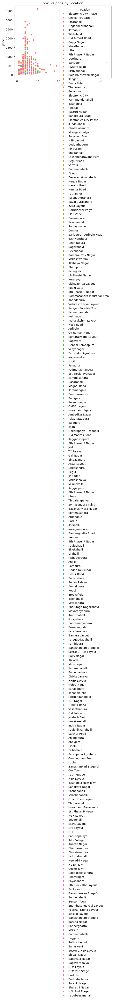

In [346]:
# Create a scatter plot with bhk vs price , colored by location
sns.scatterplot(data=df, x="bhk", y="price", hue="location")

# Set the title of the plot
plt.title('bhk  vs price by Location')

# Show the plot
plt.show()

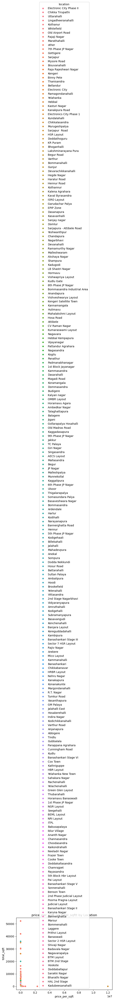

In [348]:
# Create a scatter plot with price_per_sqft vs total_sqft , colored by location
sns.scatterplot(data=df, x="price_per_sqft", y="total_sqft", hue="location")

# Set the title of the plot
plt.title('price_per_sqft  vs total_sqftt by Location')

# Show the plot
plt.show()

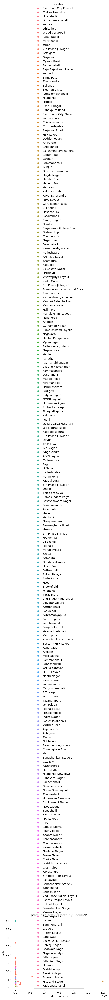

In [350]:
# Create a scatter plot with price_per_sqft vs bath , colored by location
sns.scatterplot(data=df, x="price_per_sqft", y="bath", hue="location")

# Set the title of the plot
plt.title('price_per_sqft  vs bath by Location')

# Show the plot
plt.show()

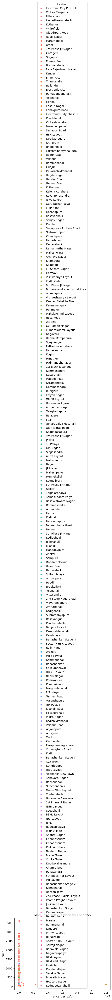

In [352]:
# Create a scatter plot with price_per_sqft vs price , colored by location
sns.scatterplot(data=df, x="price_per_sqft", y="price", hue="location")

# Set the title of the plot
plt.title('price_per_sqft  vs price by Location')

# Show the plot
plt.show()

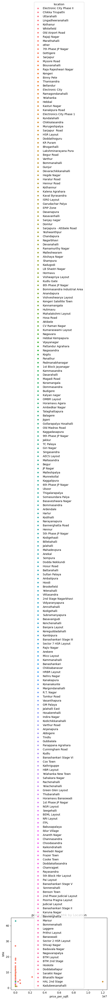

In [354]:
# Create a scatter plot with price_per_sqft vs bhk , colored by location
sns.scatterplot(data=df, x="price_per_sqft", y="bhk", hue="location")

# Set the title of the plot
plt.title('price_per_sqft  vs bhk by Location')

# Show the plot
plt.show()

***The scatter plot matrix provides an extensive visual representation of the relationships among various property features. Key insights include several important correlations:***

***Strong Correlation: There is a strong positive correlation between total square footage and price, indicating that larger properties tend to be more expensive. This relationship aligns with expectations, as larger spaces typically provide more living area and command higher prices.***

***Positive Correlation Between Bedrooms and Price: The scatter plot also reveals a positive correlation between the number of bedrooms and price. Properties with more bedrooms generally have higher prices, which is consistent with market trends.***

***Strong Positive Correlation Between Bathrooms and Bedrooms: There is a strong positive correlation between the number of bathrooms and the number of bedrooms. This suggests that properties often come equipped with multiple bathrooms to complement the number of bedrooms.***

***Moderate Positive Correlation: There is also a moderate positive correlation between total square footage and the number of bedrooms, indicating that larger homes tend to have more bedrooms.***

***Weak Correlation for Price per Square Foot: In contrast, the price per square foot shows only weak correlations with variables such as total square footage, the number of bathrooms, and the number of bedrooms. This suggests that other factors beyond these properties features play a significant role in determining price per square foot.***

***These observations provide valuable insights into property valuations and the key factors influencing real estate pricing.***


    
#***#########################################END#######################################################################***